In [27]:
import os
import json
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import defaultdict
import time
from tqdm import tqdm

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")


Using device: cuda


In [28]:
class UAVDTDataset(Dataset):
    """
    Custom Dataset class for UAVDT-style annotations with correct file naming
    """
    def __init__(self, root_dir, split='train', transforms=None, max_images=1000):
        """
        Args:
            root_dir (str): Path to dataset root directory
            split (str): 'train' or 'test'
            transforms: Optional transforms to apply
            max_images (int): Maximum number of images to load (default: 1000)
        """
        self.root_dir = root_dir
        self.split = split
        self.transforms = transforms
        self.max_images = max_images
        
        # Set paths
        self.img_dir = os.path.join(root_dir, split, 'img')
        self.ann_dir = os.path.join(root_dir, split, 'ann')
        
        # Get all image files and filter only those with annotations
        self.image_files = self._get_valid_image_files()
        
        # Build class mapping
        self.class_to_idx = self._build_class_mapping()
        self.idx_to_class = {v: k for k, v in self.class_to_idx.items()}
        
        print(f"Found {len(self.image_files)} valid images with annotations in {split} set")
        print(f"Number of classes: {len(self.class_to_idx)} (including background)")
        print(f"Classes: {list(self.class_to_idx.keys())}")
    
    def _get_annotation_filename(self, img_filename):
        """Convert image filename to annotation filename"""
        # For M0603_img000325.jpg -> M0603_img000325.jpg.json
        return img_filename + '.json'
    
    def _get_valid_image_files(self):
        """Get only image files that have corresponding annotation files"""
        all_images = [f for f in os.listdir(self.img_dir) if f.endswith('.jpg')]
        valid_images = []
        
        print(f"Checking {len(all_images)} image files for corresponding annotations...")
        
        for img_file in all_images:
            ann_file = self._get_annotation_filename(img_file)
            ann_path = os.path.join(self.ann_dir, ann_file)
            
            if os.path.exists(ann_path):
                valid_images.append(img_file)
                
                # Limit to max_images for faster training
                if len(valid_images) >= self.max_images:
                    print(f"Limiting dataset to {self.max_images} images for faster training")
                    break
            else:
                print(f"Warning: No annotation found for {img_file} (looking for {ann_file})")
        
        valid_images.sort()
        return valid_images
    
    def _build_class_mapping(self):
        """Build mapping from class names to indices"""
        classes = set(['__background__'])  # Background class at index 0
        
        # Scan all valid annotation files to find unique classes
        for img_file in self.image_files:
            ann_file = self._get_annotation_filename(img_file)
            ann_path = os.path.join(self.ann_dir, ann_file)
            
            try:
                with open(ann_path, 'r') as f:
                    data = json.load(f)
                    
                # Extract class names from objects
                if 'objects' in data:
                    for obj in data['objects']:
                        if 'classTitle' in obj:
                            classes.add(obj['classTitle'])
            except (json.JSONDecodeError, KeyError) as e:
                print(f"Warning: Error parsing {ann_file}: {e}")
                continue
        
        # Create mapping with background at index 0
        class_to_idx = {cls: idx for idx, cls in enumerate(sorted(classes))}
        return class_to_idx
    
    def _parse_annotation(self, ann_path):
        """Parse annotation file and extract bounding boxes and labels"""
        try:
            with open(ann_path, 'r') as f:
                data = json.load(f)
        except (FileNotFoundError, json.JSONDecodeError) as e:
            print(f"Error reading annotation file {ann_path}: {e}")
            return [], []
        
        boxes = []
        labels = []
        
        if 'objects' in data:
            for obj in data['objects']:
                try:
                    if obj['geometryType'] == 'rectangle' and 'points' in obj:
                        # Extract bounding box coordinates
                        points = obj['points']
                        if 'exterior' in points and len(points['exterior']) >= 2:
                            # Get top-left and bottom-right points
                            x1, y1 = points['exterior'][0]
                            x2, y2 = points['exterior'][1]
                            
                            # Ensure correct order (x1,y1 should be top-left)
                            x1, x2 = min(x1, x2), max(x1, x2)
                            y1, y2 = min(y1, y2), max(y1, y2)
                            
                            # Skip invalid boxes
                            if x2 > x1 and y2 > y1:
                                boxes.append([x1, y1, x2, y2])
                                
                                # Get class label
                                class_name = obj.get('classTitle', '__background__')
                                labels.append(self.class_to_idx.get(class_name, 0))
                except (KeyError, IndexError, TypeError) as e:
                    print(f"Warning: Error parsing object in {ann_path}: {e}")
                    continue
        
        return boxes, labels
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        # Load image
        img_file = self.image_files[idx]
        img_path = os.path.join(self.img_dir, img_file)
        
        try:
            image = Image.open(img_path).convert('RGB')
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            # Return a dummy image if loading fails
            image = Image.new('RGB', (224, 224), color='black')
        
        # Load annotations
        ann_file = self._get_annotation_filename(img_file)
        ann_path = os.path.join(self.ann_dir, ann_file)
        
        boxes, labels = self._parse_annotation(ann_path)
        
        # Handle case where no valid annotations are found
        if len(boxes) == 0:
            # Create dummy annotation for background
            h, w = image.size[1], image.size[0]  # PIL returns (width, height)
            boxes = [[0, 0, min(50, w), min(50, h)]]  # Small dummy box
            labels = [0]  # Background class
        
        # Convert to tensors
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        
        # Calculate areas
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        
        # Create target dictionary
        target = {
            'boxes': boxes,
            'labels': labels,
            'area': area,
            'iscrowd': torch.zeros((len(labels),), dtype=torch.int64),
            'image_id': torch.tensor([idx])
        }
        
        # Apply transforms
        if self.transforms:
            image = self.transforms(image)
        
        return image, target


In [29]:
# Use default 1000 images
dataset = UAVDTDataset(root_dir='/kaggle/input/uavdt-dataset', split='train', transforms=transforms)

# Use a different number (e.g., 500 images)
dataset = UAVDTDataset(root_dir='/kaggle/input/uavdt-dataset', split='train', transforms=transforms, max_images=500)

# Use all images (set to a very large number)
dataset = UAVDTDataset(root_dir='/kaggle/input/uavdt-dataset', split='train', transforms=transforms, max_images=float('inf'))


Checking 24143 image files for corresponding annotations...
Limiting dataset to 1000 images for faster training
Found 1000 valid images with annotations in train set
Number of classes: 4 (including background)
Classes: ['__background__', 'bus', 'car', 'truck']
Checking 24143 image files for corresponding annotations...
Limiting dataset to 500 images for faster training
Found 500 valid images with annotations in train set
Number of classes: 4 (including background)
Classes: ['__background__', 'bus', 'car', 'truck']
Checking 24143 image files for corresponding annotations...
Found 24143 valid images with annotations in train set
Number of classes: 4 (including background)
Classes: ['__background__', 'bus', 'car', 'truck']


In [30]:
def get_transforms(train=True):
    """Get data transforms for training/validation"""
    if train:
        return transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                               std=[0.229, 0.224, 0.225])
        ])
    else:
        return transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                               std=[0.229, 0.224, 0.225])
        ])

def collate_fn(batch):
    """Custom collate function for DataLoader"""
    return tuple(zip(*batch))

# Create datasets
dataset_path = '/kaggle/input/uavdt-dataset'

train_dataset = UAVDTDataset(
    root_dir=dataset_path,
    split='train',
    transforms=get_transforms(train=True)
)

test_dataset = UAVDTDataset(
    root_dir=dataset_path,
    split='test',
    transforms=get_transforms(train=False)
)

# Create data loaders
train_loader = DataLoader(
    train_dataset,
    batch_size=4,  # Adjust based on GPU memory
    shuffle=True,
    collate_fn=collate_fn,
    num_workers=2
)

test_loader = DataLoader(
    test_dataset,
    batch_size=4,
    shuffle=False,
    collate_fn=collate_fn,
    num_workers=2
)


Checking 24143 image files for corresponding annotations...
Limiting dataset to 1000 images for faster training
Found 1000 valid images with annotations in train set
Number of classes: 4 (including background)
Classes: ['__background__', 'bus', 'car', 'truck']
Checking 53676 image files for corresponding annotations...
Limiting dataset to 1000 images for faster training
Found 1000 valid images with annotations in test set
Number of classes: 5 (including background)
Classes: ['__background__', 'bus', 'car', 'truck', 'vehicle']


In [31]:
def get_model(num_classes):
    """
    Get Faster R-CNN model with custom number of classes
    """
    # Load pre-trained model
    model = fasterrcnn_resnet50_fpn(pretrained=True)
    
    # Replace classifier head
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    
    return model

# Initialize model
num_classes = len(train_dataset.class_to_idx)
model = get_model(num_classes)
model.to(device)

# Optimizer
optimizer = optim.SGD(
    model.parameters(),
    lr=0.005,
    momentum=0.9,
    weight_decay=0.0005
)

# Learning rate scheduler
lr_scheduler = optim.lr_scheduler.StepLR(
    optimizer,
    step_size=3,
    gamma=0.1
)


In [32]:
def train_one_epoch(model, optimizer, data_loader, device, epoch):
    """Train for one epoch"""
    model.train()
    total_loss = 0
    
    progress_bar = tqdm(data_loader, desc=f'Epoch {epoch}')
    
    for batch_idx, (images, targets) in enumerate(progress_bar):
        # Move to device
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        # Forward pass
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        
        # Backward pass
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        
        total_loss += losses.item()
        
        # Update progress bar
        progress_bar.set_postfix({
            'Loss': f'{losses.item():.4f}',
            'Avg Loss': f'{total_loss/(batch_idx+1):.4f}'
        })
    
    return total_loss / len(data_loader)

def train_model(model, train_loader, optimizer, lr_scheduler, num_epochs=10):
    """Full training loop"""
    model.to(device)
    
    for epoch in range(num_epochs):
        # Training
        avg_loss = train_one_epoch(model, optimizer, train_loader, device, epoch)
        
        # Update learning rate
        lr_scheduler.step()
        
        print(f'Epoch {epoch}: Average Loss = {avg_loss:.4f}')
        
        # Save model checkpoint
        if (epoch + 1) % 5 == 0:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': avg_loss,
            }, f'faster_rcnn_epoch_{epoch+1}.pth')
    
    return model


In [33]:
def visualize_predictions(model, dataset, num_samples=3, threshold=0.5):
    """Visualize model predictions"""
    model.eval()
    
    fig, axes = plt.subplots(num_samples, 1, figsize=(12, 4*num_samples))
    if num_samples == 1:
        axes = [axes]
    
    with torch.no_grad():
        for i in range(num_samples):
            # Get random sample
            idx = np.random.randint(len(dataset))
            image, target = dataset[idx]
            
            # Make prediction
            pred = model([image.to(device)])[0]
            
            # Convert image to numpy for visualization
            img_np = image.permute(1, 2, 0).numpy()
            img_np = img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            img_np = np.clip(img_np, 0, 1)
            
            # Plot image
            axes[i].imshow(img_np)
            axes[i].set_title(f'Sample {idx}')
            
            # Plot ground truth boxes (green)
            for box in target['boxes']:
                rect = patches.Rectangle(
                    (box[0], box[1]), box[2]-box[0], box[3]-box[1],
                    linewidth=2, edgecolor='green', facecolor='none'
                )
                axes[i].add_patch(rect)
            
            # Plot predictions (red)
            boxes = pred['boxes'].cpu()
            scores = pred['scores'].cpu()
            labels = pred['labels'].cpu()
            
            for box, score, label in zip(boxes, scores, labels):
                if score > threshold:
                    rect = patches.Rectangle(
                        (box[0], box[1]), box[2]-box[0], box[3]-box[1],
                        linewidth=2, edgecolor='red', facecolor='none'
                    )
                    axes[i].add_patch(rect)
                    
                    # Add label and score
                    class_name = dataset.idx_to_class.get(label.item(), 'unknown')
                    axes[i].text(box[0], box[1]-10, f'{class_name}: {score:.2f}',
                               bbox=dict(boxstyle="round,pad=0.3", facecolor="red", alpha=0.7),
                               fontsize=8, color='white')
            
            axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()


In [34]:
def evaluate_model(model, data_loader, device, threshold=0.5):
    """Evaluate model on test dataset"""
    model.eval()
    
    total_samples = 0
    total_detections = 0
    
    with torch.no_grad():
        for images, targets in tqdm(data_loader, desc='Evaluating'):
            images = [img.to(device) for img in images]
            
            # Get predictions
            predictions = model(images)
            
            for pred, target in zip(predictions, targets):
                total_samples += 1
                
                # Count detections above threshold
                scores = pred['scores'].cpu()
                detections = (scores > threshold).sum().item()
                total_detections += detections
    
    avg_detections = total_detections / total_samples if total_samples > 0 else 0
    
    print(f"Evaluation Results:")
    print(f"Total samples: {total_samples}")
    print(f"Total detections (score > {threshold}): {total_detections}")
    print(f"Average detections per image: {avg_detections:.2f}")
    
    return avg_detections


Starting Faster R-CNN training on UAVDT dataset...

=== Training Phase ===


Epoch 0: 100%|██████████| 250/250 [05:15<00:00,  1.26s/it, Loss=0.6401, Avg Loss=0.7252]


Epoch 0: Average Loss = 0.7252


Epoch 1: 100%|██████████| 250/250 [05:13<00:00,  1.26s/it, Loss=0.5685, Avg Loss=0.4812]


Epoch 1: Average Loss = 0.4812
Model saved as 'faster_rcnn_final.pth'

=== Evaluation Phase ===


Evaluating: 100%|██████████| 250/250 [02:21<00:00,  1.77it/s]


Evaluation Results:
Total samples: 1000
Total detections (score > 0.5): 11114
Average detections per image: 11.11

=== Visualization ===


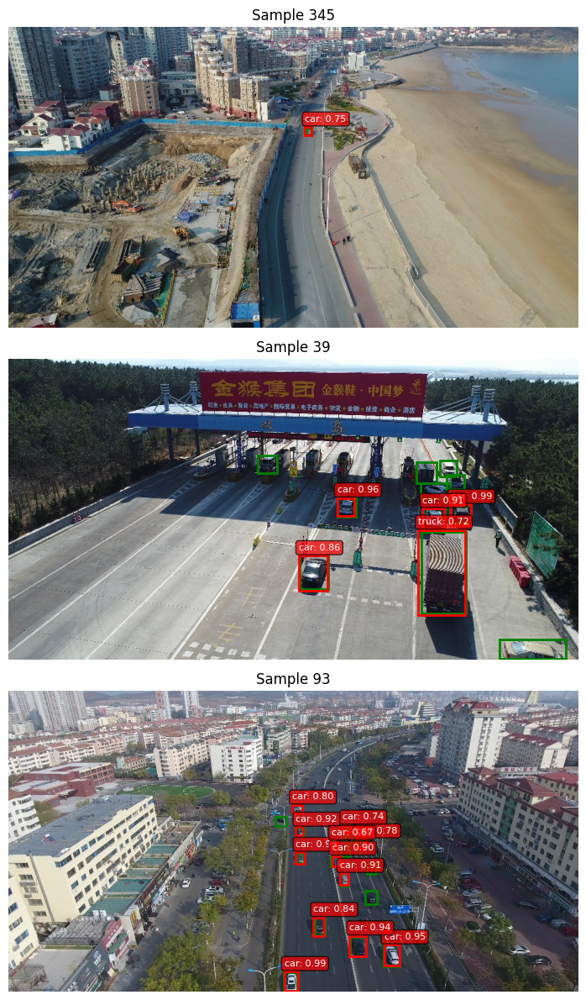

In [35]:
def main():
    """Main training function"""
    print("Starting Faster R-CNN training on UAVDT dataset...")
    
    # Train the model
    print("\n=== Training Phase ===")
    trained_model = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        lr_scheduler=lr_scheduler,
        num_epochs=2
    )
    
    # Save final model
    torch.save(trained_model.state_dict(), '/kaggle/working/faster_rcnn_final.pth')
    print("Model saved as 'faster_rcnn_final.pth'")
    
    # Evaluate on test set
    print("\n=== Evaluation Phase ===")
    evaluate_model(trained_model, test_loader, device)
    
    # Visualize some predictions
    print("\n=== Visualization ===")
    visualize_predictions(trained_model, test_dataset, num_samples=3)

# Execute training
if __name__ == "__main__":
    main()


In [36]:
def load_trained_model(model_path, num_classes):
    """Load a trained model from checkpoint"""
    model = get_model(num_classes)
    model.load_state_dict(torch.load(model_path))
    model.eval()
    return model

def predict_single_image(model, image_path, transforms, threshold=0.5):
    """Make prediction on a single image"""
    model.eval()
    
    # Load and preprocess image
    image = Image.open(image_path).convert('RGB')
    image_tensor = transforms(image).unsqueeze(0).to(device)
    
    with torch.no_grad():
        prediction = model(image_tensor)[0]
    
    # Filter predictions by threshold
    scores = prediction['scores'].cpu()
    boxes = prediction['boxes'].cpu()
    labels = prediction['labels'].cpu()
    
    mask = scores > threshold
    
    return {
        'boxes': boxes[mask],
        'scores': scores[mask],
        'labels': labels[mask]
    }


In [37]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import torch
from PIL import Image
import random

def visualize_object_detection_results(model, test_dataset, num_samples=6, 
                                     confidence_threshold=0.5, figsize=(15, 12),
                                     save_path=None, show_ground_truth=True):
    """
    Visualize object detection results on test dataset
    
    Args:
        model: Trained Faster R-CNN model
        test_dataset: Test dataset object
        num_samples: Number of samples to visualize
        confidence_threshold: Minimum confidence score for predictions
        figsize: Figure size (width, height)
        save_path: Path to save visualization (optional)
        show_ground_truth: Whether to show ground truth boxes
    """
    model.eval()
    device = next(model.parameters()).device
    
    # Create subplot grid
    rows = (num_samples + 1) // 2
    cols = 2 if num_samples > 1 else 1
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    if num_samples == 1:
        axes = [axes]
    elif rows == 1:
        axes = [axes]
    else:
        axes = axes.flatten()
    
    # Colors for different classes
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']
    class_colors = {i: colors[i % len(colors)] for i in range(len(test_dataset.class_to_idx))}
    
    with torch.no_grad():
        for i in range(num_samples):
            # Get random sample
            idx = random.randint(0, len(test_dataset) - 1)
            image, target = test_dataset[idx]
            
            # Make prediction
            image_tensor = image.unsqueeze(0).to(device)
            predictions = model(image_tensor)[0]
            
            # Convert image tensor back to numpy for visualization
            img_np = image.permute(1, 2, 0).cpu().numpy()
            # Denormalize
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            img_np = img_np * std + mean
            img_np = np.clip(img_np, 0, 1)
            
            # Plot image
            ax = axes[i]
            ax.imshow(img_np)
            ax.set_title(f'Sample {idx}', fontsize=12, fontweight='bold')
            
            # Show ground truth boxes (green)
            if show_ground_truth:
                gt_boxes = target['boxes'].cpu().numpy()
                gt_labels = target['labels'].cpu().numpy()
                
                for box, label in zip(gt_boxes, gt_labels):
                    if label > 0:  # Skip background
                        rect = patches.Rectangle(
                            (box[0], box[1]), box[2] - box[0], box[3] - box[1],
                            linewidth=2, edgecolor='lime', facecolor='none',
                            linestyle='--', alpha=0.8
                        )
                        ax.add_patch(rect)
                        
                        # Add ground truth label
                        class_name = test_dataset.idx_to_class.get(label, f'class_{label}')
                        ax.text(box[0], box[1] - 5, f'GT: {class_name}',
                               bbox=dict(boxstyle="round,pad=0.3", facecolor="lime", alpha=0.7),
                               fontsize=8, color='black', weight='bold')
            
            # Show predictions
            pred_boxes = predictions['boxes'].cpu().numpy()
            pred_scores = predictions['scores'].cpu().numpy()
            pred_labels = predictions['labels'].cpu().numpy()
            
            # Filter predictions by confidence threshold
            valid_predictions = pred_scores >= confidence_threshold
            pred_boxes = pred_boxes[valid_predictions]
            pred_scores = pred_scores[valid_predictions]
            pred_labels = pred_labels[valid_predictions]
            
            # Sort by confidence (highest first)
            sorted_indices = np.argsort(pred_scores)[::-1]
            pred_boxes = pred_boxes[sorted_indices]
            pred_scores = pred_scores[sorted_indices]
            pred_labels = pred_labels[sorted_indices]
            
            # Draw prediction boxes
            for box, score, label in zip(pred_boxes, pred_scores, pred_labels):
                color = class_colors.get(label, 'red')
                
                rect = patches.Rectangle(
                    (box[0], box[1]), box[2] - box[0], box[3] - box[1],
                    linewidth=2, edgecolor=color, facecolor='none', alpha=0.8
                )
                ax.add_patch(rect)
                
                # Add prediction label and confidence
                class_name = test_dataset.idx_to_class.get(label, f'class_{label}')
                ax.text(box[0], box[3] + 5, f'{class_name}: {score:.2f}',
                       bbox=dict(boxstyle="round,pad=0.3", facecolor=color, alpha=0.7),
                       fontsize=8, color='white', weight='bold')
            
            # Add detection count
            ax.text(0.02, 0.98, f'Detections: {len(pred_boxes)}', 
                   transform=ax.transAxes, fontsize=10,
                   bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8),
                   verticalalignment='top')
            
            ax.axis('off')
    
    # Remove empty subplots
    for i in range(num_samples, len(axes)):
        fig.delaxes(axes[i])
    
    # Add legend
    legend_elements = []
    if show_ground_truth:
        legend_elements.append(patches.Patch(color='lime', label='Ground Truth'))
    
    for class_idx, class_name in test_dataset.idx_to_class.items():
        if class_idx > 0:  # Skip background
            color = class_colors.get(class_idx, 'red')
            legend_elements.append(patches.Patch(color=color, label=f'Pred: {class_name}'))
    
    if legend_elements:
        fig.legend(handles=legend_elements, loc='center', 
                  bbox_to_anchor=(0.5, 0.02), ncol=min(len(legend_elements), 4))
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Visualization saved to: {save_path}")
    
    plt.show()
    
    # Print detection statistics
    print("\n=== Detection Statistics ===")
    total_detections = 0
    total_samples = num_samples
    
    model.eval()
    with torch.no_grad():
        for i in range(num_samples):
            idx = random.randint(0, len(test_dataset) - 1)
            image, _ = test_dataset[idx]
            image_tensor = image.unsqueeze(0).to(device)
            predictions = model(image_tensor)[0]
            
            valid_preds = (predictions['scores'].cpu().numpy() >= confidence_threshold).sum()
            total_detections += valid_preds
    
    avg_detections = total_detections / total_samples
    print(f"Average detections per image: {avg_detections:.2f}")
    print(f"Confidence threshold: {confidence_threshold}")


In [38]:
def visualize_detection_comparison(model, test_dataset, num_samples=3, 
                                 confidence_threshold=0.5, figsize=(20, 8)):
    """
    Visualize side-by-side comparison of ground truth vs predictions
    """
    model.eval()
    device = next(model.parameters()).device
    
    fig, axes = plt.subplots(num_samples, 2, figsize=figsize)
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    with torch.no_grad():
        for i in range(num_samples):
            idx = random.randint(0, len(test_dataset) - 1)
            image, target = test_dataset[idx]
            
            # Make prediction
            image_tensor = image.unsqueeze(0).to(device)
            predictions = model(image_tensor)[0]
            
            # Convert image for visualization
            img_np = image.permute(1, 2, 0).cpu().numpy()
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            img_np = img_np * std + mean
            img_np = np.clip(img_np, 0, 1)
            
            # Ground Truth (Left)
            axes[i, 0].imshow(img_np)
            axes[i, 0].set_title(f'Ground Truth - Sample {idx}', fontweight='bold')
            
            gt_boxes = target['boxes'].cpu().numpy()
            gt_labels = target['labels'].cpu().numpy()
            
            for box, label in zip(gt_boxes, gt_labels):
                if label > 0:
                    rect = patches.Rectangle(
                        (box[0], box[1]), box[2] - box[0], box[3] - box[1],
                        linewidth=2, edgecolor='green', facecolor='none'
                    )
                    axes[i, 0].add_patch(rect)
                    
                    class_name = test_dataset.idx_to_class.get(label, f'class_{label}')
                    axes[i, 0].text(box[0], box[1] - 5, class_name,
                                   bbox=dict(boxstyle="round,pad=0.3", facecolor="green", alpha=0.7),
                                   fontsize=8, color='white')
            
            axes[i, 0].axis('off')
            
            # Predictions (Right)
            axes[i, 1].imshow(img_np)
            axes[i, 1].set_title(f'Predictions - Sample {idx}', fontweight='bold')
            
            pred_boxes = predictions['boxes'].cpu().numpy()
            pred_scores = predictions['scores'].cpu().numpy()
            pred_labels = predictions['labels'].cpu().numpy()
            
            # Filter by confidence
            valid_mask = pred_scores >= confidence_threshold
            pred_boxes = pred_boxes[valid_mask]
            pred_scores = pred_scores[valid_mask]
            pred_labels = pred_labels[valid_mask]
            
            for box, score, label in zip(pred_boxes, pred_scores, pred_labels):
                rect = patches.Rectangle(
                    (box[0], box[1]), box[2] - box[0], box[3] - box[1],
                    linewidth=2, edgecolor='red', facecolor='none'
                )
                axes[i, 1].add_patch(rect)
                
                class_name = test_dataset.idx_to_class.get(label, f'class_{label}')
                axes[i, 1].text(box[0], box[1] - 5, f'{class_name}: {score:.2f}',
                               bbox=dict(boxstyle="round,pad=0.3", facecolor="red", alpha=0.7),
                               fontsize=8, color='white')
            
            axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()


In [39]:
trained_model = load_trained_model('faster_rcnn_final.pth', num_classes)


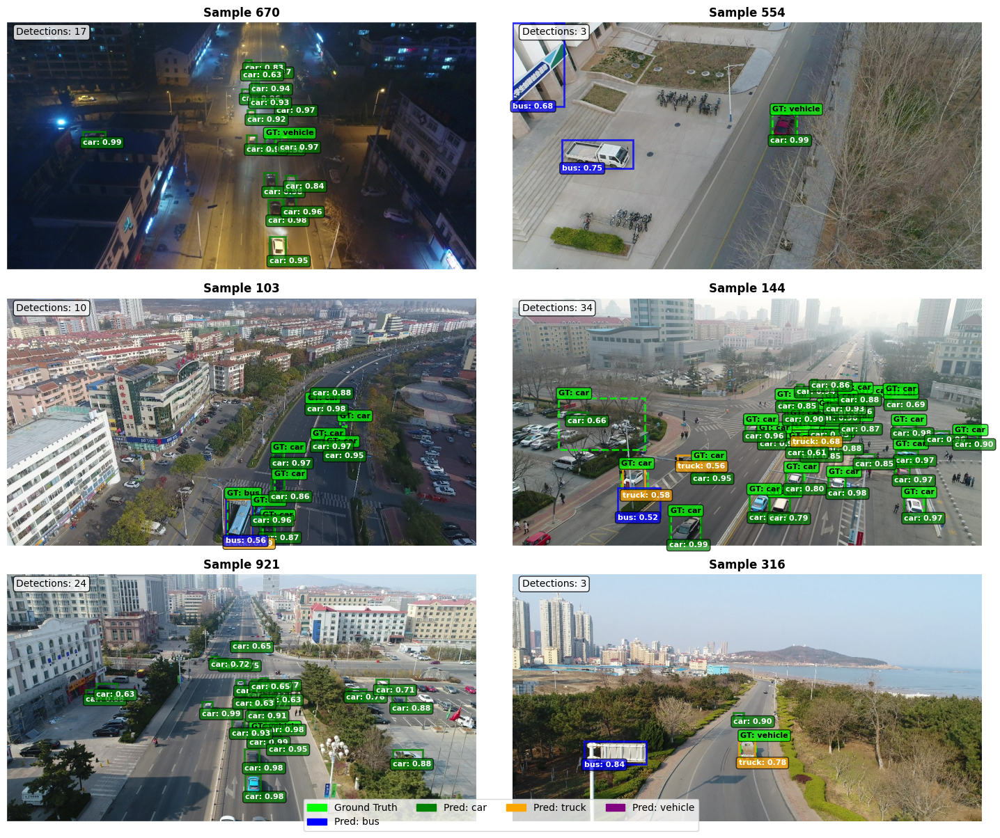


=== Detection Statistics ===
Average detections per image: 10.17
Confidence threshold: 0.5
Visualization saved to: detection_results.png


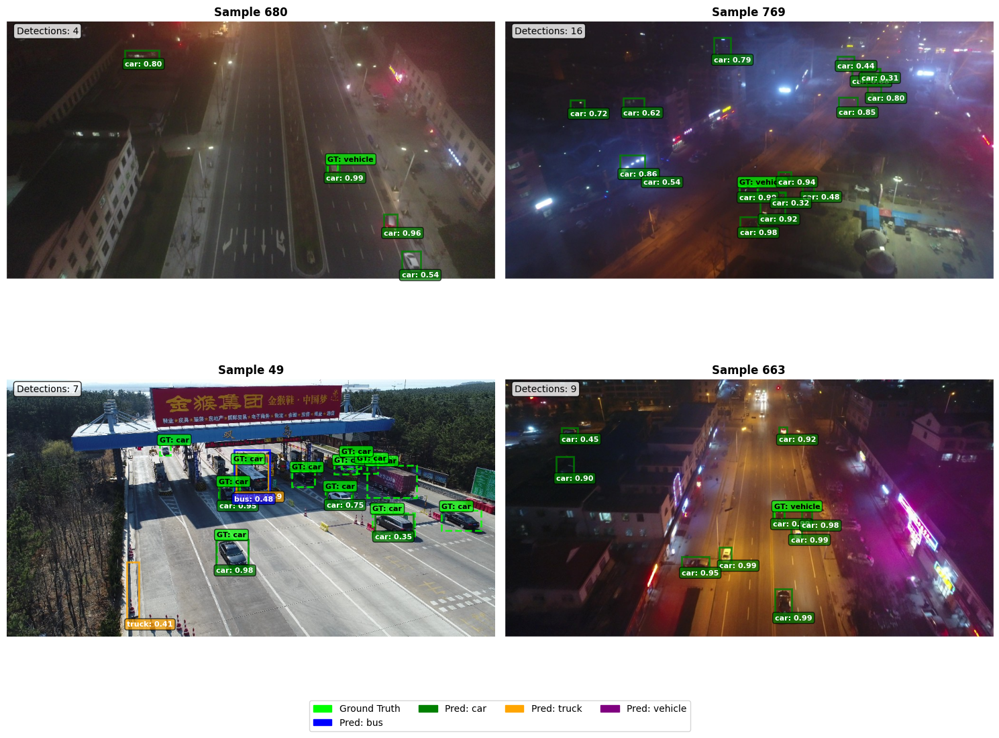


=== Detection Statistics ===
Average detections per image: 15.00
Confidence threshold: 0.3


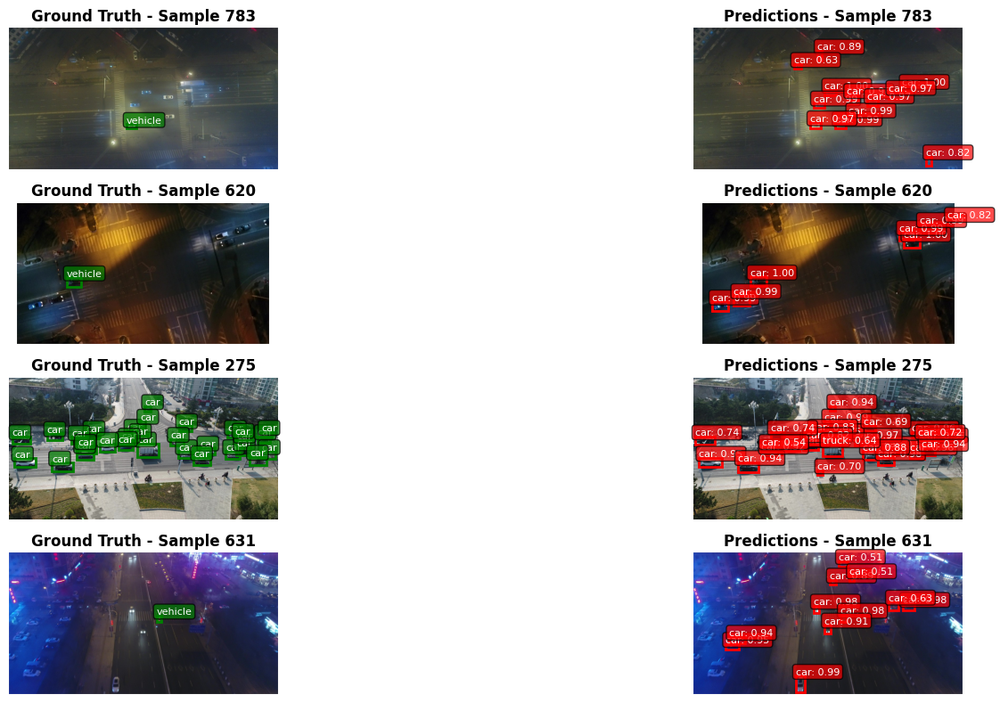

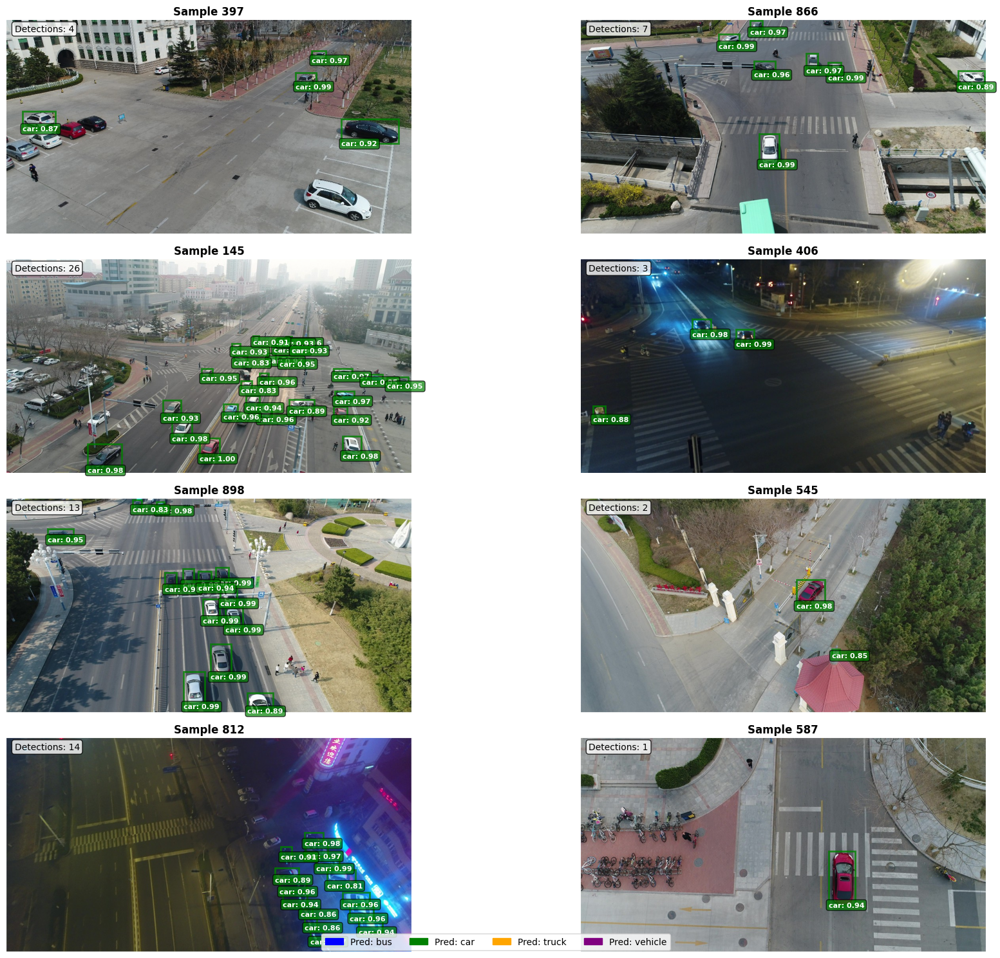


=== Detection Statistics ===
Average detections per image: 5.62
Confidence threshold: 0.8


In [40]:
# Basic usage with your trained model
visualize_object_detection_results(
    model=trained_model,
    test_dataset=test_dataset,
    num_samples=6,
    confidence_threshold=0.5
)

# Save visualization to file
visualize_object_detection_results(
    model=trained_model,
    test_dataset=test_dataset,
    num_samples=4,
    confidence_threshold=0.3,
    save_path='detection_results.png'
)

# Side-by-side comparison
visualize_detection_comparison(
    model=trained_model,
    test_dataset=test_dataset,
    num_samples=4,
    confidence_threshold=0.5
)

# High-confidence detections only
visualize_object_detection_results(
    model=trained_model,
    test_dataset=test_dataset,
    num_samples=8,
    confidence_threshold=0.8,
    show_ground_truth=False,  # Only show predictions
    figsize=(20, 15)
)
